In [1]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy.optimize as spopt
import scipy.fftpack as spfft
import scipy.ndimage as spimg
import cvxpy as cvx
from scipy.spatial.distance import cdist
from pylbfgs import owlqn
import imageio

In [2]:
def dct2(x):
    return spfft.dct(spfft.dct(x.T, norm='ortho', axis=0).T, norm='ortho', axis=0)

def idct2(x):
    return spfft.idct(spfft.idct(x.T, norm='ortho', axis=0).T, norm='ortho', axis=0)

In [3]:
def progress(x, g, fx, xnorm, gnorm, step, k, ls):
    return 0

def reconstruct(img,s=0.1):
    Xorig = img
    X = Xorig
    ny,nx = X.shape
    
    def evaluate(x, g, step):
        x2 = x.reshape((nx, ny)).T
        Ax2 = idct2(x2)
        Ax = Ax2.T.flat[ri].reshape(b.shape)
        Axb = Ax - b
        fx = np.sum(np.power(Axb, 2))
        Axb2 = np.zeros(x2.shape)
        Axb2.T.flat[ri] = Axb
        AtAxb2 = 2 * dct2(Axb2)
        AtAxb = AtAxb2.T.reshape(x.shape)
        np.copyto(g, AtAxb)
        return fx
    
    masks = np.zeros(Xorig.shape, dtype='uint8')
    k = round(nx * ny * s)
    ri = np.random.choice(nx * ny, k, replace=False)
    mask = np.zeros(X.shape)
    mask.T.flat[ri] = 255
    Xm = 255 * np.ones(X.shape)
    Xm.T.flat[ri] = X.T.flat[ri]
    b = X.T.flat[ri].astype(float)
    Xat2 = owlqn(nx*ny, evaluate, progress, 5)
    Xat = Xat2.reshape(nx, ny).T
    Xa = idct2(Xat)
    
    return Xorig,Xm,Xa

def reconstruct2(img,s=0.1):
    Xorig = img
    X = Xorig
    ny,nx = X.shape
    
    def evaluate(x, g, step):
        x2 = x.reshape((nx, ny)).T
        Ax2 = idct2(x2)
        Ax = Ax2.T.flat[ri].reshape(b.shape)
        Axb = Ax - b
        fx = np.sum(np.power(Axb, 2))
        Axb2 = np.zeros(x2.shape)
        Axb2.T.flat[ri] = Axb
        AtAxb2 = 2 * dct2(Axb2)
        AtAxb = AtAxb2.T.reshape(x.shape)
        np.copyto(g, AtAxb)
        return fx
    
    masks = np.zeros(Xorig.shape, dtype='uint8')
    k = round(nx * ny * s)
    
    ri1 = np.array(np.random.normal(0,20, 2*k)).astype(int) + ny//2
    ri1 = ri1[ri1 < ny]
    ri2 = np.array(np.random.normal(0,20, 2*k)).astype(int) + nx//2
    ri2 = ri2[ri2 < nx]
    rii = np.concatenate((ri1[:k].reshape(-1,1),ri2[:k].reshape(-1,1)),axis=1)
    tmp = np.zeros(img.shape)
    tmp[rii[:,0],rii[:,1]]=255
    ri = np.where(tmp.T.flat > 0)
    mask = np.zeros(X.shape)
    mask.T.flat[ri] = 255
    Xm = 255 * np.ones(X.shape)
    Xm.T.flat[ri] = X.T.flat[ri]
    b = X.T.flat[ri].astype(float)
    Xat2 = owlqn(nx*ny, evaluate, progress, 5)
    Xat = Xat2.reshape(nx, ny).T
    Xa = idct2(Xat)
    
    return Xorig,Xm,Xa

def reconstruct3(img,w,s=0.1):
    Xorig = img
    X = Xorig
    ny,nx = X.shape
    
    def evaluate(x, g, step):
        x2 = x.reshape((nx, ny)).T
        Ax2 = idct2(x2)
        Ax = Ax2.T.flat[ri].reshape(b.shape)
        Axb = Ax - b
        fx = np.sum(np.power(Axb, 2))
        Axb2 = np.zeros(x2.shape)
        Axb2.T.flat[ri] = Axb
        AtAxb2 = 2 * dct2(Axb2)
        AtAxb = AtAxb2.T.reshape(x.shape)
        np.copyto(g, AtAxb)
        return fx
    
    masks = np.zeros(Xorig.shape, dtype='uint8')
    k = round(nx * ny * s)
    ri = np.random.choice(nx * ny, k, replace=False)
    ri = np.setdiff1d(ri,w,True)
    mask = np.zeros(X.shape)
    mask.T.flat[ri] = 255
    Xm = 255 * np.ones(X.shape)
    Xm.T.flat[ri] = X.T.flat[ri]
    b = X.T.flat[ri].astype(float)
    Xat2 = owlqn(nx*ny, evaluate, progress, 5)
    Xat = Xat2.reshape(nx, ny).T
    Xa = idct2(Xat)
    
    return Xorig,Xm,Xa

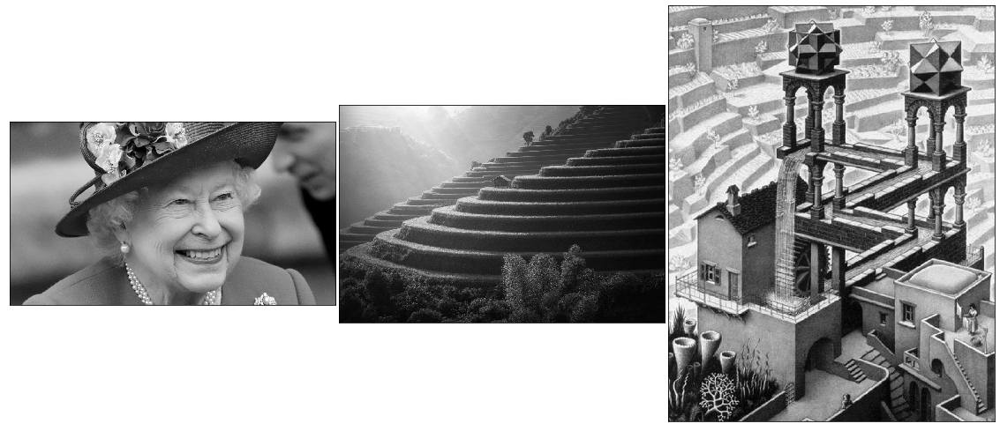

In [4]:
face = imageio.imread('face.jpg',as_gray=True, pilmode='L')
landscape = imageio.imread('landscape.jpg',as_gray=True, pilmode='L')
detail = imageio.imread('tower.jpeg',as_gray=True, pilmode='L')

pictures = np.array([face,landscape,detail])

fig, ax = plt.subplots(1,3,figsize=(20,10),subplot_kw={'xticks':[], 'yticks':[]},gridspec_kw=dict(hspace=0.01, wspace=0.01))
for (i,img) in enumerate(pictures):
    ax[i].imshow(img,cmap='gray')

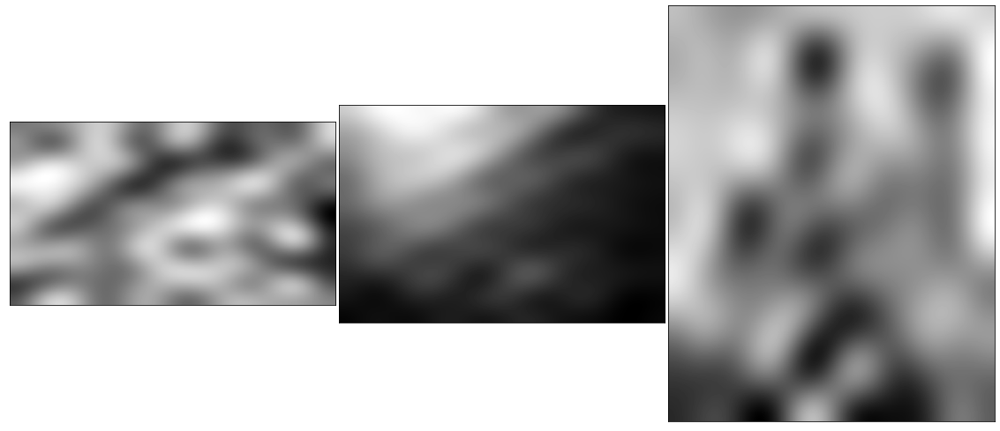

In [5]:
fig, ax = plt.subplots(1,3,figsize=(20,10),subplot_kw={'xticks':[], 'yticks':[]},gridspec_kw=dict(hspace=0.01, wspace=0.01))
for (i,img) in enumerate(pictures):
    tmp = dct2(img)
    tmp[:10,10:]=0
    tmp[10:,:] = 0
    ax[i].imshow(idct2(tmp),cmap='gray')

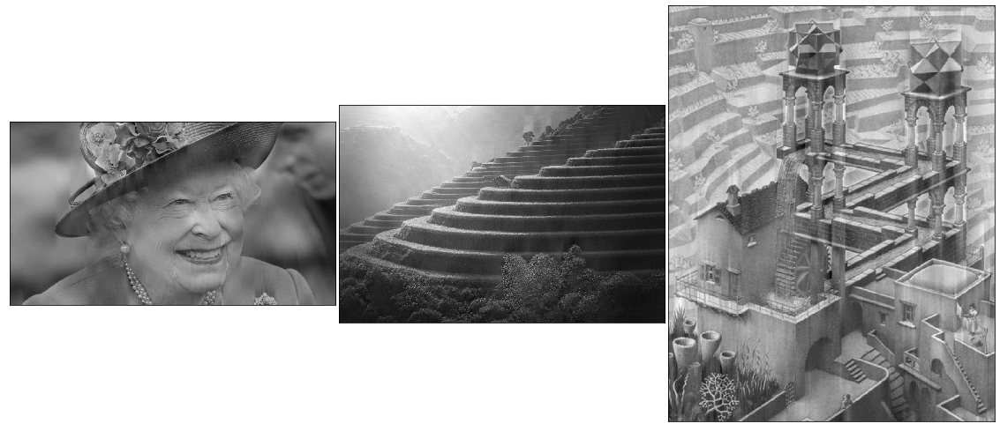

In [6]:
fig, ax = plt.subplots(1,3,figsize=(20,10),subplot_kw={'xticks':[], 'yticks':[]},gridspec_kw=dict(hspace=0.01, wspace=0.01))
for (i,img) in enumerate(pictures):
    tmp = dct2(img)
    tmp[:10,10:]=0
    ax[i].imshow(idct2(tmp),cmap='gray')

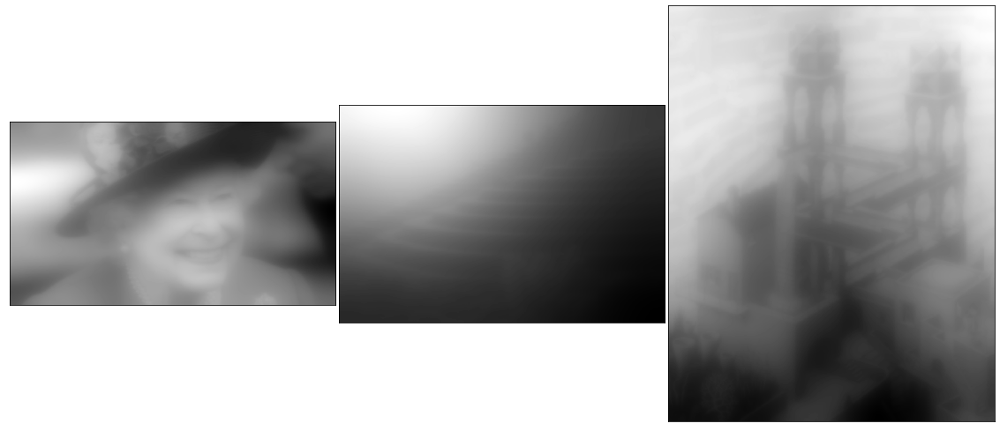

In [7]:
fig, ax = plt.subplots(1,3,figsize=(20,10),subplot_kw={'xticks':[], 'yticks':[]},gridspec_kw=dict(hspace=0.01, wspace=0.01))
for (i,img) in enumerate(pictures):
    tmp = dct2(img)
    dist = np.ones(tmp.shape)
    idx = np.array(np.where(dist > 0)).T
    dist = cdist(np.zeros((1,2)), idx)[0]
    dist[0] = 0.001
    tmp = tmp/(dist.reshape(tmp.shape)*10)
    ax[i].imshow(idct2(tmp),cmap='gray')

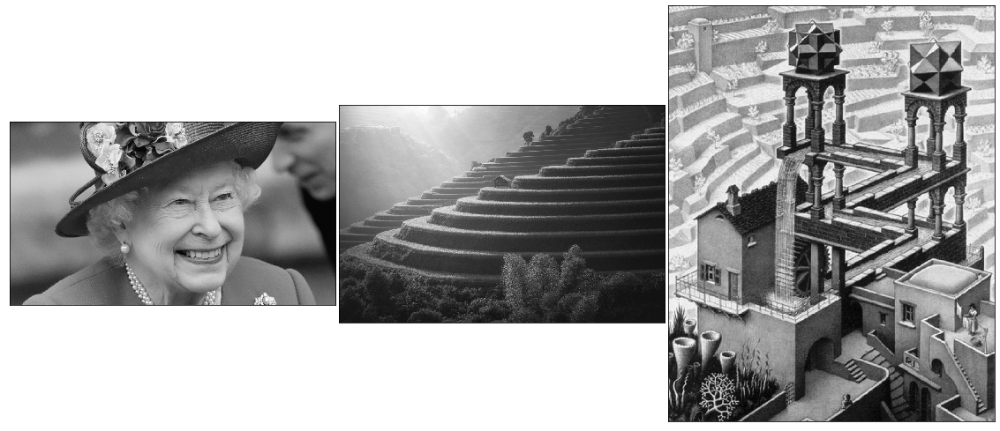

In [8]:
fig, ax = plt.subplots(1,3,figsize=(20,10),subplot_kw={'xticks':[], 'yticks':[]},gridspec_kw=dict(hspace=0.01, wspace=0.01))
for (i,img) in enumerate(pictures):
    tmp = dct2(img)
    mid = np.array(tmp.shape)//2
    m_x=mid[0]
    m_y=mid[1]
    tmp[m_x-m_x//3:m_x+m_x//2,m_y-m_x//2:m_y+m_x//2] = 0
    ax[i].imshow(idct2(tmp),cmap='gray')

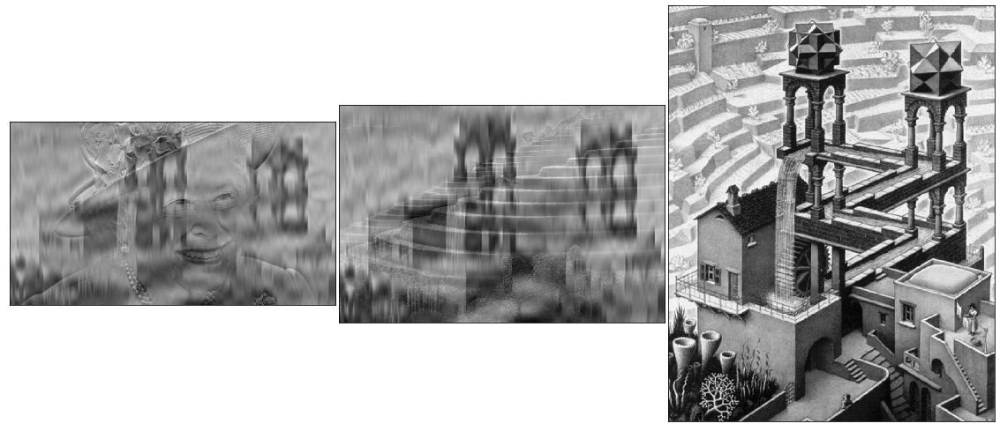

In [9]:
fig, ax = plt.subplots(1,3,figsize=(20,10),subplot_kw={'xticks':[], 'yticks':[]},gridspec_kw=dict(hspace=0.01, wspace=0.01))
tmps = np.array([dct2(p) for p in pictures])
for (i,tmp) in enumerate(tmps):
    mid = np.array(tmp.shape)//2
    m_x=mid[0]
    m_y=mid[1]
    tmp[:20,:1200] = tmps[2][:20,:1200]
    ax[i].imshow(idct2(tmp),cmap='gray')

/home/pituuuss/anaconda3/lib/python3.7/site-packages/scipy/ndimage/interpolation.py:611: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


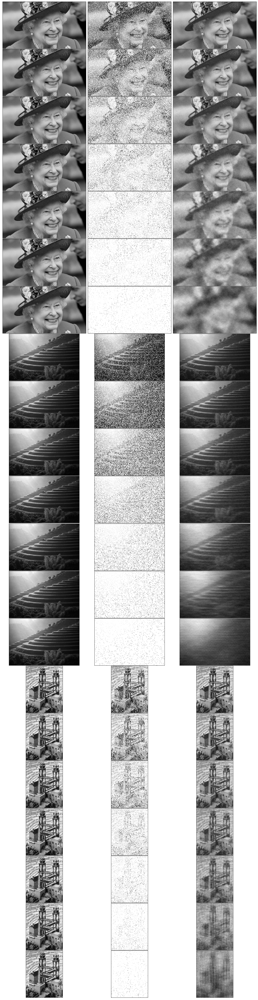

In [10]:
img_precents = [0.8,0.6,0.4,0.2,0.1,0.05,0.02]
rec_results = {0.8 : [],0.6 : [], 0.4 : [],0.2 : [],0.1 : [],0.05 : [],0.02 : []}
pictures_small=[spimg.zoom(p,0.3) for p in pictures]
fig, ax = plt.subplots(3*len(img_precents),3,figsize=(20,80),subplot_kw={'xticks':[], 'yticks':[]},gridspec_kw=dict(hspace=0.01, wspace=0.01))
for (j,s) in enumerate(img_precents):
    for (i,img) in enumerate(pictures_small):
        res=reconstruct(img,s)
        rec_results[s] += [res]
        Xorig,Xm,Xa = res
        ax[i*len(img_precents) + j,0].imshow(Xorig,cmap='gray')
        ax[i*len(img_precents) + j,1].imshow(Xm,cmap='gray')
        ax[i*len(img_precents) + j,2].imshow(Xa,cmap='gray')

In [11]:
errs = {}
for s in img_precents:
    diff = np.array(rec_results[s])[:,0] - np.array(rec_results[s])[:,2]
    err = [np.abs(d).sum() for d in diff]
    errs[s] = err if s not in errs.keys() else errs[s] + err

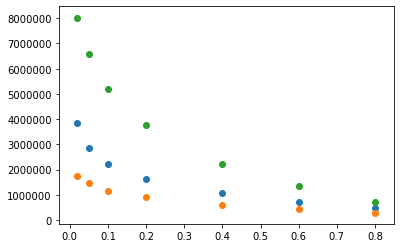

In [12]:
d1 = []
d2 = []
d3 = []
for s in img_precents:
    d1 += [errs[s][0]]
    d2 += [errs[s][1]]
    d3 += [errs[s][2]]
    
plt.scatter(img_precents,d1)
plt.scatter(img_precents,d2)
plt.scatter(img_precents,d3)

In [13]:
res1 = []
res2 = []
res3 = []
for j in range(10):
    tmp_res = []
    for (i,img) in enumerate(pictures_small):
        r = reconstruct(img,0.6)
        _,_,Xa = r
        if i == 0:
            res1 += [Xa.flatten()]
        if i == 1:
            res2 += [Xa.flatten()]
        if i == 2:
            res3 += [Xa.flatten()]

In [14]:
res1 = np.array(res1) - pictures_small[0].flatten()
res2 = np.array(res2) - pictures_small[1].flatten()
res3 = np.array(res3) - pictures_small[2].flatten()

In [15]:
res1_mean = np.mean(res1,axis = 0)
res2_mean = np.mean(res2,axis = 0)
res3_mean = np.mean(res3,axis = 0)

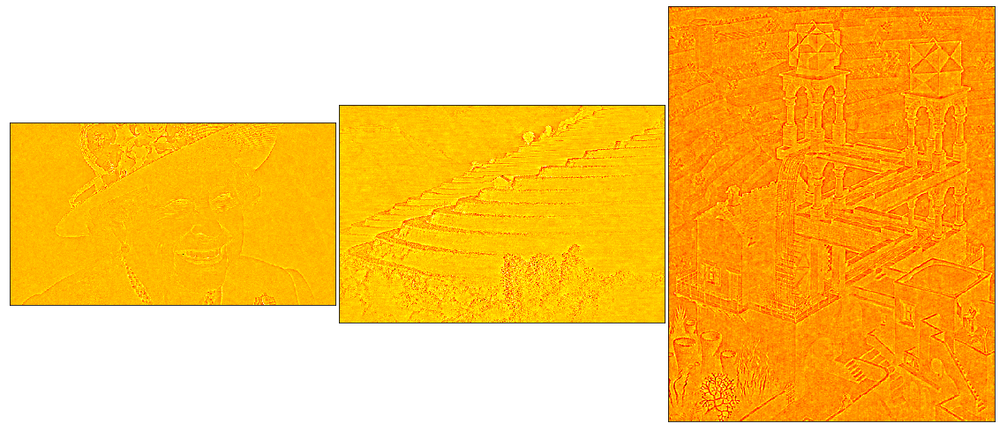

In [16]:
fig, ax = plt.subplots(1,3,figsize=(20,10),subplot_kw={'xticks':[], 'yticks':[]},gridspec_kw=dict(hspace=0.01, wspace=0.01))
ax[0].imshow(res1_mean.reshape(pictures_small[0].shape),cmap='hot')
ax[1].imshow(res2_mean.reshape(pictures_small[1].shape),cmap='hot')
ax[2].imshow(res3_mean.reshape(pictures_small[2].shape),cmap='hot')

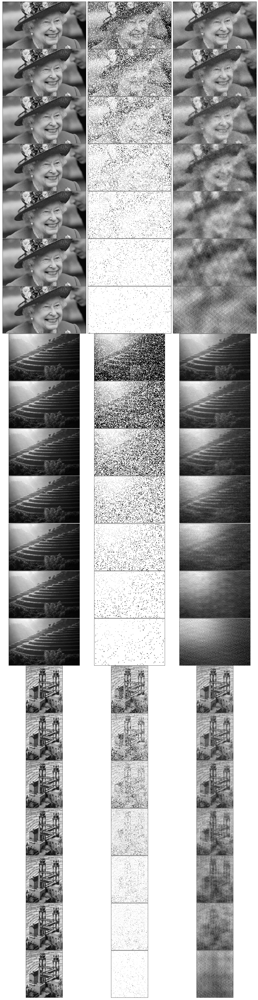

In [17]:
img_precents = [0.8,0.6,0.4,0.2,0.1,0.05,0.02]
rec_results = {0.8 : [],0.6 : [], 0.4 : [],0.2 : [],0.1 : [],0.05 : [],0.02 : []}
pictures_smaller=[spimg.zoom(p,0.4) for p in pictures_small]
fig, ax = plt.subplots(3*len(img_precents),3,figsize=(20,80),subplot_kw={'xticks':[], 'yticks':[]},gridspec_kw=dict(hspace=0.01, wspace=0.01))
for (j,s) in enumerate(img_precents):
    for (i,img) in enumerate(pictures_smaller):
        res=reconstruct(img,s)
        rec_results[s] += [res]
        Xorig,Xm,Xa = res
        ax[i*len(img_precents) + j,0].imshow(Xorig,cmap='gray')
        ax[i*len(img_precents) + j,1].imshow(Xm,cmap='gray')
        ax[i*len(img_precents) + j,2].imshow(Xa,cmap='gray')

In [18]:
errs = {}
for s in img_precents:
    diff = np.array(rec_results[s])[:,0] - np.array(rec_results[s])[:,2]
    err = [np.abs(d).sum() for d in diff]
    errs[s] = err if s not in errs.keys() else errs[s] + err

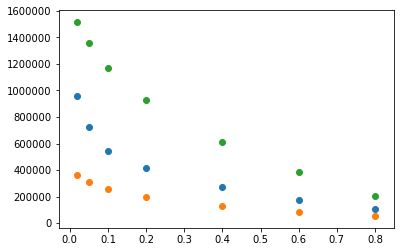

In [19]:
d1 = []
d2 = []
d3 = []
for s in img_precents:
    d1 += [errs[s][0]]
    d2 += [errs[s][1]]
    d3 += [errs[s][2]]
    
plt.scatter(img_precents,d1)
plt.scatter(img_precents,d2)
plt.scatter(img_precents,d3)

In [20]:
res1 = []
res2 = []
res3 = []
for j in range(10):
    tmp_res = []
    for (i,img) in enumerate(pictures_smaller):
        r = reconstruct(img,0.6)
        _,_,Xa = r
        if i == 0:
            res1 += [Xa.flatten()]
        if i == 1:
            res2 += [Xa.flatten()]
        if i == 2:
            res3 += [Xa.flatten()]

In [21]:
res1 = np.array(res1) - pictures_smaller[0].flatten()
res2 = np.array(res2) - pictures_smaller[1].flatten()
res3 = np.array(res3) - pictures_smaller[2].flatten()
res1.shape

(10, 28702)

In [22]:
res1_mean = np.mean(res1,axis = 0)
res2_mean = np.mean(res2,axis = 0)
res3_mean = np.mean(res3,axis = 0)

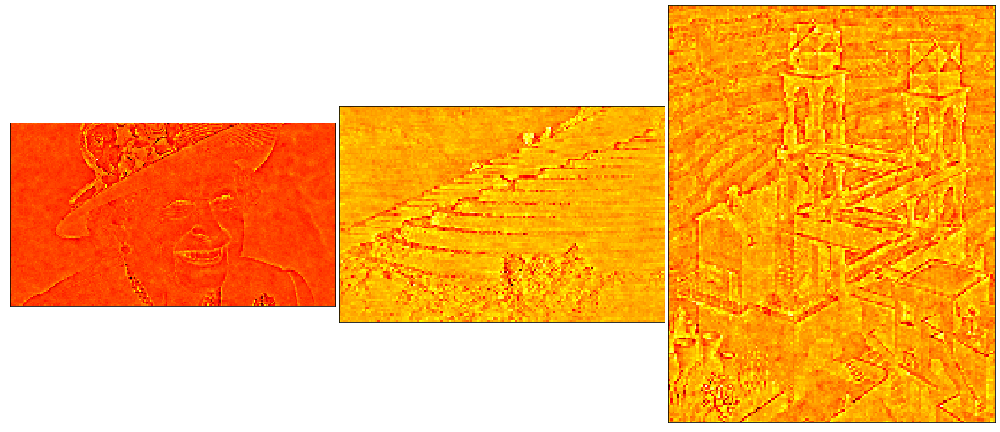

In [23]:
fig, ax = plt.subplots(1,3,figsize=(20,10),subplot_kw={'xticks':[], 'yticks':[]},gridspec_kw=dict(hspace=0.01, wspace=0.01))
ax[0].imshow(res1_mean.reshape(pictures_smaller[0].shape),cmap='hot')
ax[1].imshow(res2_mean.reshape(pictures_smaller[1].shape),cmap='hot')
ax[2].imshow(res3_mean.reshape(pictures_smaller[2].shape),cmap='hot')

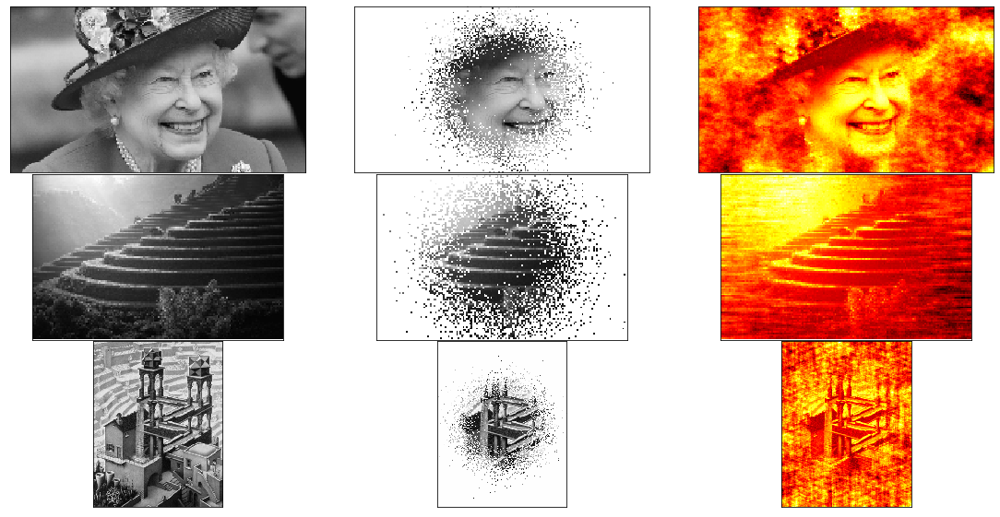

In [24]:
fig, ax = plt.subplots(3,3,figsize=(20,10),subplot_kw={'xticks':[], 'yticks':[]},gridspec_kw=dict(hspace=0.01, wspace=0.01))
for (i,img) in enumerate(pictures_smaller):
    res=reconstruct2(img,0.8)
    Xorig,Xm,Xa = res
    ax[i,0].imshow(Xorig,cmap='gray')
    ax[i,1].imshow(Xm,cmap='gray')
    ax[i,2].imshow(Xa,cmap='hot')

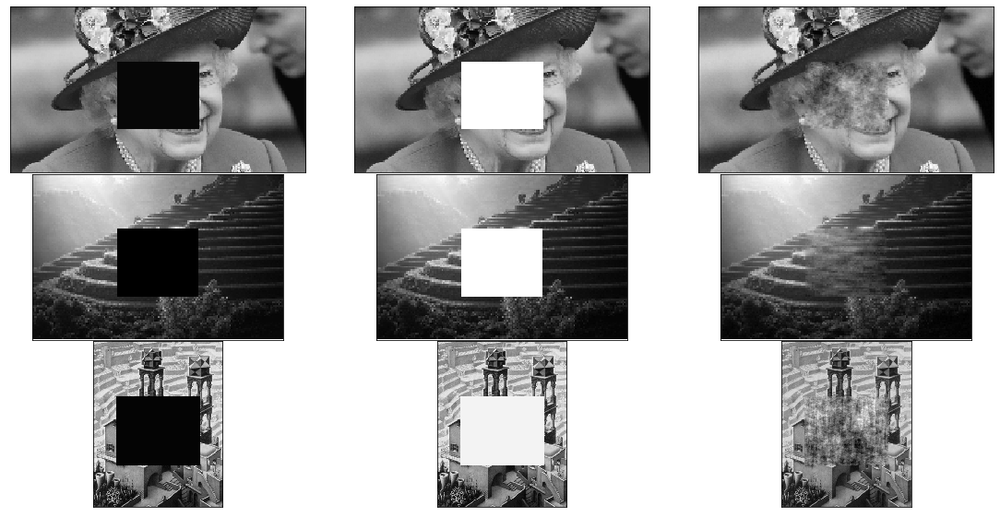

In [25]:
fig, ax = plt.subplots(3,3,figsize=(20,10),subplot_kw={'xticks':[], 'yticks':[]},gridspec_kw=dict(hspace=0.01, wspace=0.01))
for (i,image) in enumerate(pictures_smaller):
    img = np.copy(image)
    mid = np.array(img.shape)//2
    m_x=mid[0]
    m_y=mid[1]
    img[m_x-m_x//3:m_x+m_x//2,m_y-m_x//2:m_y+m_x//2] = 0
    without = np.where(img.T.flatten() == 0)
    res=reconstruct3(img,without,1)
    Xorig,Xm,Xa = res
    ax[i,0].imshow(Xorig,cmap='gray')
    ax[i,1].imshow(Xm,cmap='gray')
    ax[i,2].imshow(Xa,cmap='gray')

In [26]:
img = np.copy(pictures_smaller[2])
shp = np.array(img.shape)
double_res = np.zeros(shp*2 + 1)

In [29]:
cords = np.where(img)

In [30]:
new_x = cords[0] * 2 + 1
new_y = cords[1] * 2 + 1

In [31]:
double_res[new_x[:],new_y[:]] = img[cords[0],cords[1]]

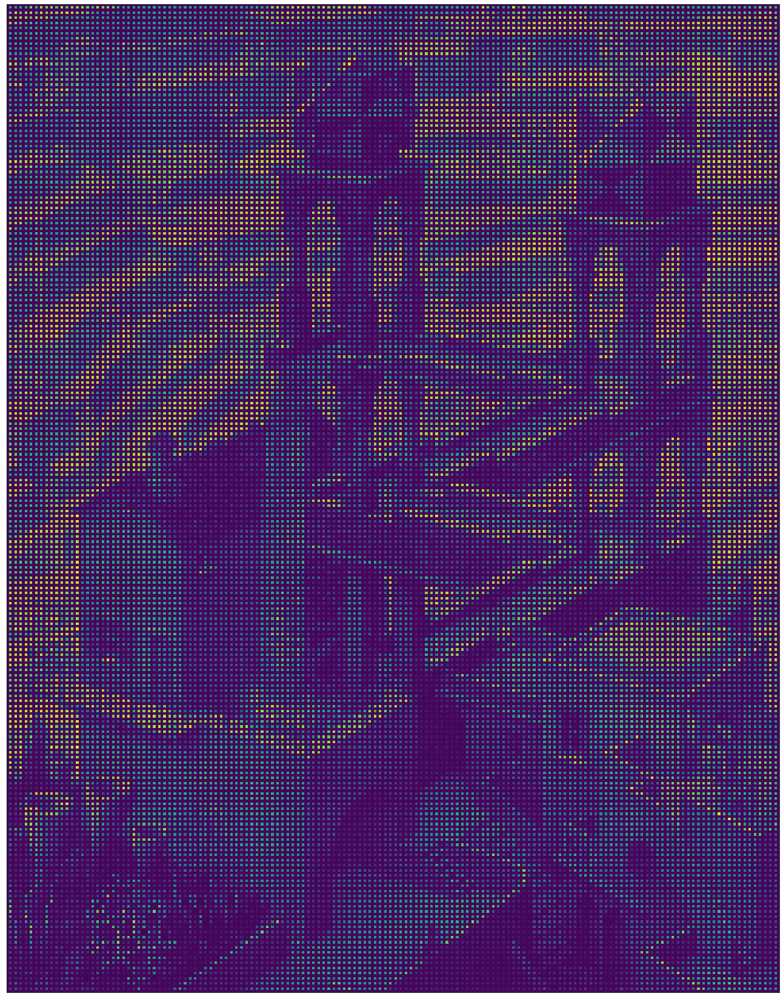

In [32]:
fig, ax = plt.subplots(1,figsize=(30,30),subplot_kw={'xticks':[], 'yticks':[]},gridspec_kw=dict(hspace=0.01, wspace=0.01))
ax.imshow(double_res)

In [33]:
without = without = np.where(double_res.T.flatten() == 0)
Xorig,Xm,Xa=reconstruct3(double_res,without,1)

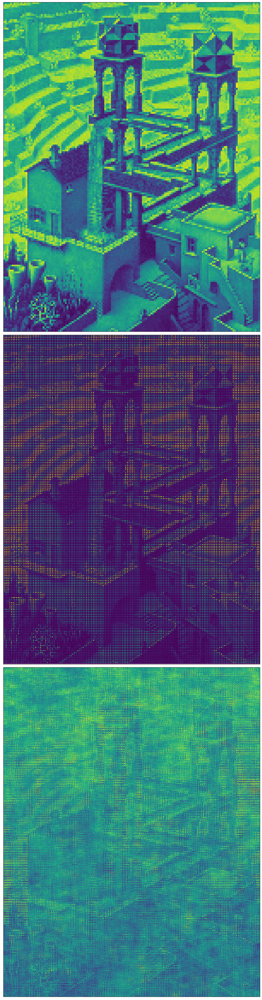

In [34]:
fig, ax = plt.subplots(3,1,figsize=(30,60),subplot_kw={'xticks':[], 'yticks':[]},gridspec_kw=dict(hspace=0.01, wspace=0.01))
ax[0].imshow(img)
ax[1].imshow(Xorig)
ax[2].imshow(Xa*2)